# UFC Data Analysis

## Marshall Ferguson 7/2021

In [1]:
# Imports

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import tree

In [2]:
# Read in dataset

df = pd.read_csv('ufc-master.csv')

df

,R_fighter,B_fighter,R_odds,B_odds,R_ev,B_ev,date,location,country,Winner,...,R_pass_bout,B_pass_bout,R_rev_bout,B_rev_bout,r_dec_odds,b_dec_odds,r_sub_odds,b_sub_odds,r_ko_odds,b_ko_odds
0,Dustin Poirier,Conor McGregor,-129,100,77.519380,100.000000,7/10/2021,"Las Vegas, Nevada, USA",USA,Red,...,NaN,NaN,NaN,NaN,550.0,700.0,575.0,2200.0,165.0,150.0
1,Gilbert Burns,Stephen Thompson,130,-162,130.000000,61.728395,7/10/2021,"Las Vegas, Nevada, USA",USA,Red,...,NaN,NaN,NaN,NaN,400.0,150.0,475.0,2500.0,525.0,250.0
2,Tai Tuivasa,Greg Hardy,-130,105,76.923077,105.000000,7/10/2021,"Las Vegas, Nevada, USA",USA,Red,...,NaN,NaN,NaN,NaN,350.0,350.0,1600.0,1800.0,160.0,265.0
3,Irene Aldana,Yana Kunitskaya,-107,-115,93.457944,86.956522,7/10/2021,"Las Vegas, Nevada, USA",USA,Red,...,NaN,NaN,NaN,NaN,160.0,150.0,1200.0,1200.0,425.0,800.0
4,Sean O'Malley,Kris Moutinho,-1000,580,10.000000,580.000000,7/10/2021,"Las Vegas, Nevada, USA",USA,Red,...,NaN,NaN,NaN,NaN,400.0,1400.0,800.0,1600.0,-300.0,1200.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4778,Duane Ludwig,Darren Elkins,-155,135,64.516129,135.000000,3/21/2010,"Broomfield, Colorado, USA",USA,Blue,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4779,John Howard,Daniel Roberts,-210,175,47.619048,175.000000,3/21/2010,"Broomfield, Colorado, USA",USA,Red,...,0.0,1.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
4780,Brendan Schaub,Chase Gormley,-260,220,38.461538,220.000000,3/21/2010,"Broomfield, Colorado, USA",USA,Red,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4781,Mike Pierce,Julio Paulino,-420,335,23.809524,335.000000,3/21/2010,"Broomfield, Colorado, USA",USA,Red,...,6.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


# First, let's have some fun playing with the dataset

## Who is the fighter with...

In [3]:
# The most KO/TKO wins

blue_most_KOs = df['B_win_by_KO/TKO'].max()
red_most_KOs = df['R_win_by_KO/TKO'].max()
index_blue_most_KOs = pd.Index(df['B_win_by_KO/TKO']).argmax()
index_red_most_KOs = pd.Index(df['R_win_by_KO/TKO']).argmax()

most_KOs = None
numb_of_KOs = None
if blue_most_KOs > red_most_KOs:
    most_KOs = df['B_fighter'].iloc[index_blue_most_KOs]
    numb_of_KOs = blue_most_KOs
else:
    most_KOs = df['R_fighter'].iloc[index_red_most_KOs]
    numb_of_KOs = red_most_KOs

print(f'The fighter with the most wins by KO/TKO is {most_KOs} with {numb_of_KOs} KOs')

The fighter with the most wins by KO/TKO is Mauricio Rua with 21 KOs


In [4]:
# The most submission wins

blue_most_subs = df['B_win_by_Submission'].max()
red_most_subs = df['R_win_by_Submission'].max()
index_blue_most_subs = pd.Index(df['B_win_by_Submission']).argmax()
index_red_most_subs = pd.Index(df['R_win_by_Submission']).argmax()

most_subs = None
numb_of_subs = None
if blue_most_subs > red_most_subs:
    most_subs = df['B_fighter'].iloc[index_blue_most_subs]
    numb_of_subs = blue_most_subs
else:
    most_subs = df['R_fighter'].iloc[index_red_most_subs]
    numb_of_subs = red_most_subs

print(f'The fighter with the most wins by submission is {most_subs} with {numb_of_subs} submissions')

The fighter with the most wins by submission is Charles Oliveira with 14 submissions


In [5]:
# The most Majority Decision wins

blue_most_MDs = df['B_win_by_Decision_Majority'].max()
red_most_MDs = df['R_win_by_Decision_Majority'].max()
index_blue_most_MDs = pd.Index(df['B_win_by_Decision_Majority']).argmax()
index_red_most_MDs = pd.Index(df['R_win_by_Decision_Majority']).argmax()

most_MDs = None
numb_of_MDs = None
if blue_most_MDs > red_most_MDs:
    most_MDs = df['B_fighter'].iloc[index_blue_most_MDs]
    numb_of_MDs = blue_most_MDs
else:
    most_MDs = df['R_fighter'].iloc[index_red_most_MDs]
    numb_of_MDs = red_most_MDs

print(f'The fighter with the most wins by Majority Decision is {most_MDs} with {numb_of_MDs} MD\'s')

The fighter with the most wins by Majority Decision is Daniel Omielanczuk with 2 MD's


In [6]:
# The most Split Decision wins

blue_most_SDs = df['B_win_by_Decision_Split'].max()
red_most_SDs = df['R_win_by_Decision_Split'].max()
index_blue_most_SDs = pd.Index(df['B_win_by_Decision_Split']).argmax()
index_red_most_SDs = pd.Index(df['R_win_by_Decision_Split']).argmax()

most_SDs = None
numb_of_SDs = None
if blue_most_SDs > red_most_SDs:
    most_SDs = df['B_fighter'].iloc[index_blue_most_SDs]
    numb_of_SDs = blue_most_SDs
else:
    most_SDs = df['R_fighter'].iloc[index_red_most_SDs]
    numb_of_SDs = red_most_SDs

print(f'The fighter with the most wins by Split Decision is {most_SDs} with {numb_of_SDs} SD\'s')

The fighter with the most wins by Split Decision is Gleison Tibau with 5 SD's


In [7]:
# The most Unaninmous Decision wins
blue_most_UDs = df['B_win_by_Decision_Unanimous'].max()
red_most_UDs = df['R_win_by_Decision_Unanimous'].max()
index_blue_most_UDs = pd.Index(df['B_win_by_Decision_Unanimous']).argmax()
index_red_most_UDs = pd.Index(df['R_win_by_Decision_Unanimous']).argmax()

most_UDs = None
numb_of_UDs = None
if blue_most_UDs > red_most_UDs:
    most_UDs = df['B_fighter'].iloc[index_blue_most_UDs]
    numb_of_UDs = blue_most_UDs
else:
    most_UDs = df['R_fighter'].iloc[index_red_most_UDs]
    numb_of_UDs = red_most_UDs

print(f'The fighter with the most wins by Unanimous Decision is {most_UDs} with {numb_of_UDs} UD\'s')

The fighter with the most wins by Unanimous Decision is Neil Magny with 10 UD's


In [8]:
# The most decision wins

df['B_win_by_Decision'] = df['B_win_by_Decision_Majority'] + df['B_win_by_Decision_Split'] + df['B_win_by_Decision_Unanimous']
df['R_win_by_Decision'] = df['R_win_by_Decision_Majority'] + df['R_win_by_Decision_Split'] + df['R_win_by_Decision_Unanimous']

blue_most_decisions = df['B_win_by_Decision'].max()
red_most_decisions = df['R_win_by_Decision'].max()
index_blue_most_decisions = pd.Index(df['B_win_by_Decision']).argmax()
index_red_most_decisions = pd.Index(df['R_win_by_Decision']).argmax()

most_decisions = None
numb_of_decisions = None
if blue_most_decisions > red_most_decisions:
    most_decisions = df['B_fighter'].iloc[index_blue_most_decisions]
    numb_of_decisions = blue_most_decisions
else:
    most_decisions = df['R_fighter'].iloc[index_red_most_decisions]
    numb_of_decisions = red_most_decisions

print(f'The fighter with the most wins by Decision is {most_decisions} with {numb_of_decisions} decisions')

The fighter with the most wins by Decision is Diego Sanchez with 13 decisions


## What variables will have the most impact on the target variable?

In [9]:
# Slice out unneeded Series from DataFrame

columns_to_drop = ['B_match_weightclass_rank', 'R_match_weightclass_rank', 'R_Women\'s Flyweight_rank', 'R_Women\'s Featherweight_rank',
                'R_Women\'s Strawweight_rank', 'R_Women\'s Bantamweight_rank', 'R_Heavyweight_rank', 'R_Light Heavyweight_rank', 'R_Middleweight_rank',                             'R_Welterweight_rank', 'R_Lightweight_rank', 'R_Featherweight_rank', 'R_Bantamweight_rank', 'R_Flyweight_rank', 'R_Pound-for-Pound_rank',                           'B_Women\'s Flyweight_rank', 'B_Women\'s Featherweight_rank', 'B_Women\'s Strawweight_rank', 'B_Women\'s Bantamweight_rank', 'B_Heavyweight_rank',                  'B_Light Heavyweight_rank', 'B_Middleweight_rank', 'B_Welterweight_rank', 'B_Lightweight_rank', 'B_Featherweight_rank', 'B_Bantamweight_rank',                      'B_Flyweight_rank', 'B_Pound-for-Pound_rank']


df_trim = df
df_trim = df_trim.drop(columns_to_drop, axis = 1)
df_trim

,R_fighter,B_fighter,R_odds,B_odds,R_ev,B_ev,date,location,country,Winner,...,R_rev_bout,B_rev_bout,r_dec_odds,b_dec_odds,r_sub_odds,b_sub_odds,r_ko_odds,b_ko_odds,B_win_by_Decision,R_win_by_Decision
0,Dustin Poirier,Conor McGregor,-129,100,77.519380,100.000000,7/10/2021,"Las Vegas, Nevada, USA",USA,Red,...,NaN,NaN,550.0,700.0,575.0,2200.0,165.0,150.0,2,7
1,Gilbert Burns,Stephen Thompson,130,-162,130.000000,61.728395,7/10/2021,"Las Vegas, Nevada, USA",USA,Red,...,NaN,NaN,400.0,150.0,475.0,2500.0,525.0,250.0,6,5
2,Tai Tuivasa,Greg Hardy,-130,105,76.923077,105.000000,7/10/2021,"Las Vegas, Nevada, USA",USA,Red,...,NaN,NaN,350.0,350.0,1600.0,1800.0,160.0,265.0,1,1
3,Irene Aldana,Yana Kunitskaya,-107,-115,93.457944,86.956522,7/10/2021,"Las Vegas, Nevada, USA",USA,Red,...,NaN,NaN,160.0,150.0,1200.0,1200.0,425.0,800.0,4,3
4,Sean O'Malley,Kris Moutinho,-1000,580,10.000000,580.000000,7/10/2021,"Las Vegas, Nevada, USA",USA,Red,...,NaN,NaN,400.0,1400.0,800.0,1600.0,-300.0,1200.0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4778,Duane Ludwig,Darren Elkins,-155,135,64.516129,135.000000,3/21/2010,"Broomfield, Colorado, USA",USA,Blue,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0,1
4779,John Howard,Daniel Roberts,-210,175,47.619048,175.000000,3/21/2010,"Broomfield, Colorado, USA",USA,Red,...,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,0,2
4780,Brendan Schaub,Chase Gormley,-260,220,38.461538,220.000000,3/21/2010,"Broomfield, Colorado, USA",USA,Red,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0,0
4781,Mike Pierce,Julio Paulino,-420,335,23.809524,335.000000,3/21/2010,"Broomfield, Colorado, USA",USA,Red,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0,1


<AxesSubplot:>

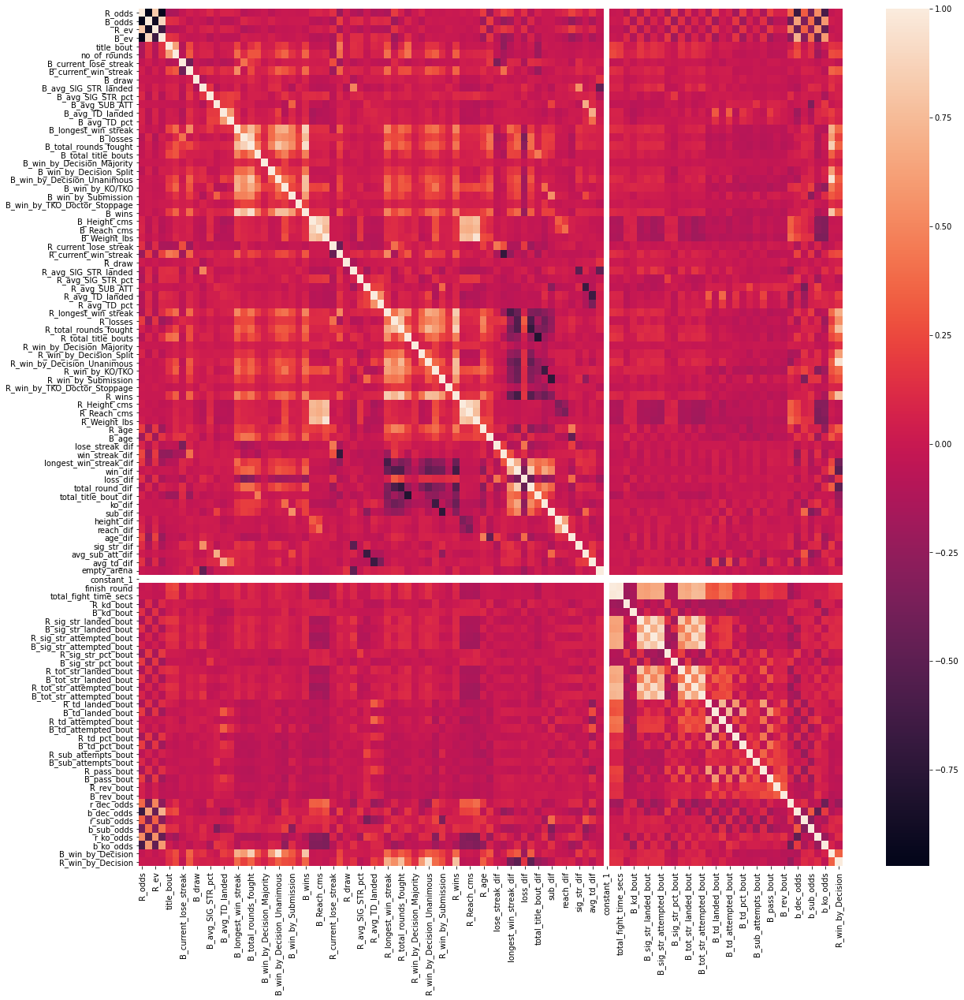

In [10]:
corr = df_trim.corr()

fig, ax = plt.subplots(figsize=[20, 20])
sns.heatmap(corr, ax=ax)

# This will output a figure that is 20inx20in
# If this needs to be changed for any reason, 
# change the int's in the figsize parameter for plt.subplots

Based on the heatmap, it looks like there are stronger correlations between some of the differential stats of the Red and Blue fighters

In [11]:
# Filter out a new df containing only the target variable and the chosen determinants
vars_of_interest = ['streak_dif','win_streak_dif','longest_win_streak_dif','win_dif','loss_dif','total_round_dif','total_title_bout_dif','ko_dif','sub_dif','height_dif','reach_dif','age_dif','sig_str_dif','avg_sub_att_dif','avg_td_dif']

df_dif = df_trim.filter(vars_of_interest, axis=1)

df_dif

,win_streak_dif,longest_win_streak_dif,win_dif,loss_dif,total_round_dif,total_title_bout_dif,ko_dif,sub_dif,height_dif,reach_dif,age_dif,sig_str_dif,avg_sub_att_dif,avg_td_dif
0,-2,2,-10,-3,-37,2,-2,-3,0.00,5.08,0,-0.300000,-1.100000,-0.830000
1,2,1,-1,0,9,1,2,-4,5.08,10.16,4,0.940000,-0.600000,-1.860000
2,-2,-1,1,0,5,0,1,0,7.62,12.70,4,0.360000,0.000000,0.200000
3,2,-1,-1,-2,-11,1,-1,-1,-7.62,0.00,-2,-1.330000,0.100000,1.310000
4,-1,-5,-6,-1,-13,0,-4,0,-10.16,-10.16,2,-3.440000,-0.600000,-0.630000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4778,0,-2,-2,1,-5,0,-1,0,0.00,2.54,6,-13.666667,0.000000,0.000000
4779,-3,-3,-3,0,-9,0,-1,0,7.62,7.62,-2,-18.000000,-1.000000,-4.666667
4780,0,0,0,0,0,-1,0,0,-2.54,-2.12,0,-4.000000,1.000000,1.000000
4781,0,-1,-1,1,-6,0,0,0,10.16,7.62,-5,-40.500000,0.000000,-3.500000


In [12]:
# Create a dummy var: 1 if Blue won the fight, 0 otherwise
B_win = df_trim['Winner'].apply(lambda x: x=='Blue' and 1 or 0)
B_win.name = 'B_win'
df_dif = pd.concat([df_dif, B_win], axis=1)

df_dif

,win_streak_dif,longest_win_streak_dif,win_dif,loss_dif,total_round_dif,total_title_bout_dif,ko_dif,sub_dif,height_dif,reach_dif,age_dif,sig_str_dif,avg_sub_att_dif,avg_td_dif,B_win
0,-2,2,-10,-3,-37,2,-2,-3,0.00,5.08,0,-0.300000,-1.100000,-0.830000,0
1,2,1,-1,0,9,1,2,-4,5.08,10.16,4,0.940000,-0.600000,-1.860000,0
2,-2,-1,1,0,5,0,1,0,7.62,12.70,4,0.360000,0.000000,0.200000,0
3,2,-1,-1,-2,-11,1,-1,-1,-7.62,0.00,-2,-1.330000,0.100000,1.310000,0
4,-1,-5,-6,-1,-13,0,-4,0,-10.16,-10.16,2,-3.440000,-0.600000,-0.630000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4778,0,-2,-2,1,-5,0,-1,0,0.00,2.54,6,-13.666667,0.000000,0.000000,1
4779,-3,-3,-3,0,-9,0,-1,0,7.62,7.62,-2,-18.000000,-1.000000,-4.666667,0
4780,0,0,0,0,0,-1,0,0,-2.54,-2.12,0,-4.000000,1.000000,1.000000,0
4781,0,-1,-1,1,-6,0,0,0,10.16,7.62,-5,-40.500000,0.000000,-3.500000,0


<AxesSubplot:>

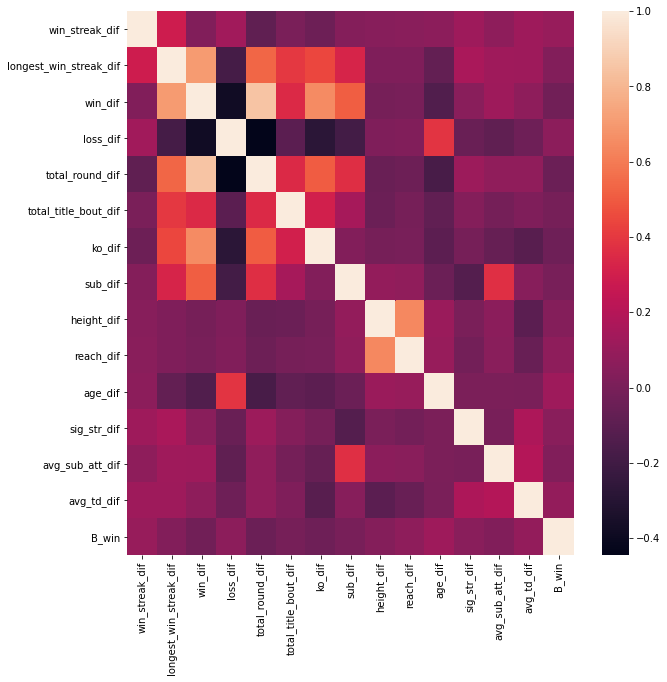

In [13]:
# Create heat map of differential stats

corr = df_dif.corr()

fig, ax = plt.subplots(figsize=[10, 10])
sns.heatmap(corr, ax=ax)

In [14]:
X = df_dif.loc[:, df_dif.columns != 'B_win']
y = df_dif.B_win


.51869363880087, 111.438, 'X[8] <= 1.27\ngini = 0.441\nsamples = 76\nvalue = [51, 25]'),
 Text(101.34272483548622, 106.002, 'X[10] <= -0.5\ngini = 0.469\nsamples = 64\nvalue = [40, 24]'),
 Text(99.8920789666098, 100.566, 'X[0] <= 0.5\ngini = 0.358\nsamples = 30\nvalue = [23, 7]'),
 Text(99.50524006824274, 95.13, 'X[9] <= -19.05\ngini = 0.293\nsamples = 28\nvalue = [23, 5]'),
 Text(98.73156227150865, 89.694, 'X[12] <= -0.717\ngini = 0.444\nsamples = 3\nvalue = [1, 2]'),
 Text(98.3447233731416, 84.25800000000001, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(99.1184011698757, 84.25800000000001, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]'),
 Text(100.27891786497685, 89.694, 'X[11] <= -3.321\ngini = 0.211\nsamples = 25\nvalue = [22, 3]'),
 Text(99.8920789666098, 84.25800000000001, 'X[1] <= -1.5\ngini = 0.153\nsamples = 24\nvalue = [22, 2]'),
 Text(99.50524006824274, 78.822, 'X[9] <= -8.89\ngini = 0.48\nsamples = 5\nvalue = [3, 2]'),
 Text(99.1184011698757, 73.386, 'gini = 0.0\nsamples = 

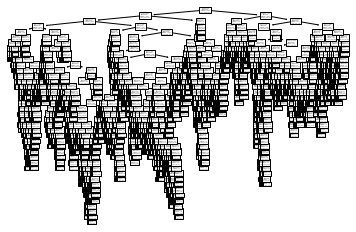

In [15]:
clf = tree.DecisionTreeClassifier(random_state=5)
clf = clf.fit(X, y)

tree.plot_tree(clf)

In [16]:
# Let's try this by using the given winner variable rather than the dummy variable

df_dif = df_dif.drop("B_win", axis=1)

df_dif

,win_streak_dif,longest_win_streak_dif,win_dif,loss_dif,total_round_dif,total_title_bout_dif,ko_dif,sub_dif,height_dif,reach_dif,age_dif,sig_str_dif,avg_sub_att_dif,avg_td_dif
0,-2,2,-10,-3,-37,2,-2,-3,0.00,5.08,0,-0.300000,-1.100000,-0.830000
1,2,1,-1,0,9,1,2,-4,5.08,10.16,4,0.940000,-0.600000,-1.860000
2,-2,-1,1,0,5,0,1,0,7.62,12.70,4,0.360000,0.000000,0.200000
3,2,-1,-1,-2,-11,1,-1,-1,-7.62,0.00,-2,-1.330000,0.100000,1.310000
4,-1,-5,-6,-1,-13,0,-4,0,-10.16,-10.16,2,-3.440000,-0.600000,-0.630000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4778,0,-2,-2,1,-5,0,-1,0,0.00,2.54,6,-13.666667,0.000000,0.000000
4779,-3,-3,-3,0,-9,0,-1,0,7.62,7.62,-2,-18.000000,-1.000000,-4.666667
4780,0,0,0,0,0,-1,0,0,-2.54,-2.12,0,-4.000000,1.000000,1.000000
4781,0,-1,-1,1,-6,0,0,0,10.16,7.62,-5,-40.500000,0.000000,-3.500000


In [17]:
winner = df['Winner']
df_dif = pd.concat([df_dif, winner], axis=1)

df_dif

,win_streak_dif,longest_win_streak_dif,win_dif,loss_dif,total_round_dif,total_title_bout_dif,ko_dif,sub_dif,height_dif,reach_dif,age_dif,sig_str_dif,avg_sub_att_dif,avg_td_dif,Winner
0,-2,2,-10,-3,-37,2,-2,-3,0.00,5.08,0,-0.300000,-1.100000,-0.830000,Red
1,2,1,-1,0,9,1,2,-4,5.08,10.16,4,0.940000,-0.600000,-1.860000,Red
2,-2,-1,1,0,5,0,1,0,7.62,12.70,4,0.360000,0.000000,0.200000,Red
3,2,-1,-1,-2,-11,1,-1,-1,-7.62,0.00,-2,-1.330000,0.100000,1.310000,Red
4,-1,-5,-6,-1,-13,0,-4,0,-10.16,-10.16,2,-3.440000,-0.600000,-0.630000,Red
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4778,0,-2,-2,1,-5,0,-1,0,0.00,2.54,6,-13.666667,0.000000,0.000000,Blue
4779,-3,-3,-3,0,-9,0,-1,0,7.62,7.62,-2,-18.000000,-1.000000,-4.666667,Red
4780,0,0,0,0,0,-1,0,0,-2.54,-2.12,0,-4.000000,1.000000,1.000000,Red
4781,0,-1,-1,1,-6,0,0,0,10.16,7.62,-5,-40.500000,0.000000,-3.500000,Red


In [18]:
X = df_dif.loc[:, df_dif.columns != 'Winner']
y = df_dif.Winner

[Text(176.96571428571428, 207.55636363636364, 'age_dif <= 2.5\ngini = 0.486\nsamples = 4783\nvalue = [1988, 2795]\nclass = Red'),
 Text(102.83142857142857, 187.7890909090909, 'age_dif <= -2.5\ngini = 0.469\nsamples = 3161\nvalue = [1187, 1974]\nclass = Red'),
 Text(52.611428571428576, 168.0218181818182, 'reach_dif <= -3.81\ngini = 0.445\nsamples = 1400\nvalue = [468, 932]\nclass = Red'),
 Text(19.13142857142857, 148.25454545454545, 'total_title_bout_dif <= -0.5\ngini = 0.403\nsamples = 511\nvalue = [143, 368]\nclass = Red'),
 Text(9.565714285714286, 128.48727272727274, 'gini = 0.305\nsamples = 101\nvalue = [19, 82]\nclass = Red'),
 Text(28.697142857142858, 128.48727272727274, 'total_round_dif <= 4.5\ngini = 0.422\nsamples = 410\nvalue = [124, 286]\nclass = Red'),
 Text(19.13142857142857, 108.72, 'sig_str_dif <= -2.274\ngini = 0.445\nsamples = 278\nvalue = [93, 185]\nclass = Red'),
 Text(9.565714285714286, 88.95272727272729, 'gini = 0.4\nsamples = 130\nvalue = [36, 94]\nclass = Red'),
 

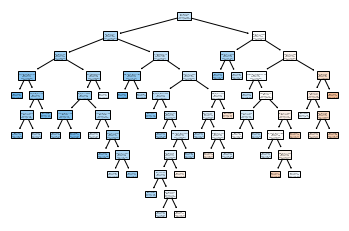

In [23]:
clf = tree.DecisionTreeClassifier(random_state=5, min_samples_leaf=100)
clf = clf.fit(X, y)

tree.plot_tree(clf, class_names=clf.classes_, filled=True, feature_names=X.columns)